In [66]:
%load_ext autoreload
%autoreload 2
from cosypose.rendering.bullet_scene_renderer import BulletSceneRenderer
from cosypose.datasets.datasets_cfg import make_scene_dataset
from bokeh.io import output_notebook, show; output_notebook()
from bokeh.plotting import gridplot
import matplotlib.pyplot as plt
import numpy as np
from cosypose.lib3d import Transform
from cosypose.visualization.plotter import Plotter
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading BokehJS ...

In [ ]:
ds_name, urdf_ds_name = 'bracket_assembly', 'bracket_assembly'
scene_ds = make_scene_dataset(ds_name)
scene_id = 0
mask = scene_ds.frame_index['scene_id'] == scene_id
scene_ds.frame_index = scene_ds.frame_index[mask].reset_index(drop=True)


1 day, 1:57:42.803520 - Building index and loading annotations...


[Memory]93462.9s, 1557.7min: Loading build_index...


In [79]:
scene_ds.frame_index.iloc[[10,20],:]

,scene_id,cam_id,view_id,cam_name
10,0,cam,10,cam
20,0,cam,20,cam


In [73]:
frame_ids = [10,20,30,40]
select_price = scene_ds.iloc[scene_ds.frame_index in frame_ids]

AttributeError: 'BOPDataset' object has no attribute 'loc'

In [71]:
scene_ds.frame_index

,scene_id,cam_id,view_id,cam_name
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
994,False,False,False,False
995,False,False,False,False
996,False,False,False,False
997,False,False,False,False


In [ ]:
np.where(img1 != img2)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [68]:
def get_random_image(scene_ds, idx=None):
    renderer = BulletSceneRenderer(urdf_ds_name)
    if idx is None:
        idx = np.random.randint(len(scene_ds))
#     print("idx:", idx)
    ds_rgb, mask, state = scene_ds[idx]
    
    objects = state['objects']
    camera = state['camera']
    print([o['bbox'] for o in objects])
#     print(camera)
    cameras = [camera]
    image = renderer.render_scene(objects, cameras)[0]['rgb']
    renderer.disconnect()
    return ds_rgb, image

ds_rgb, render_rgb = get_random_image(scene_ds, idx=20)

plotter = Plotter()
fig_ds_rgb = plotter.plot_image(ds_rgb)
fig_render_rgb = plotter.plot_image(render_rgb)
fig_overlay = plotter.plot_overlay(ds_rgb, render_rgb)
fig_dets = plotter.plot_maskrcnn_bboxes(fig_ds_rgb, scene_ds[20])
show(gridplot([[fig_ds_rgb, fig_render_rgb, fig_overlay, fig_dets]], sizing_mode='scale_width'))

EGL device choice: 0 of 4 (from EGL_VISIBLE_DEVICES)


Loaded EGL 1.5 after reload.
GL_VENDOR=NVIDIA Corporation
GL_RENDERER=Tesla T4/PCIe/SSE2
GL_VERSION=4.6.0 NVIDIA 510.73.08
GL_SHADING_LANGUAGE_VERSION=4.60 NVIDIA
Version = 4.6.0 NVIDIA 510.73.08
Vendor = NVIDIA Corporation
Renderer = Tesla T4/PCIe/SSE2
[[44, 0, 719, 539], [305, 256, 483, 368], [468, 245, 680, 456], [286, 230, 577, 528], [0, 0, 138, 539], [0, 0, 159, 131], [0, 296, 354, 539]]
ven = NVIDIA Corporation
Destroy EGL OpenGL window.


AttributeError: 'tuple' object has no attribute 'bboxes'

In [123]:
image

Figure(id='11978', ...)

In [126]:

ds_name, urdf_ds_name = 'tless.primesense.test', 'tless.cad'
scene_ds = make_scene_dataset(ds_name)
def get_random_image(scene_ds, idx=None):
    renderer = BulletSceneRenderer(urdf_ds_name)
    if idx is None:
        idx = np.random.randint(len(scene_ds))
    print("idx:", idx)
    ds_rgb, mask, state = scene_ds[idx]
    
    objects = state['objects']
    camera = state['camera']
    print([obj['bbox'] for obj in objects])
    cameras = [camera]
    image = renderer.render_scene(objects, cameras)[0]['rgb']
    renderer.disconnect()
    return ds_rgb, image

ds_rgb, render_rgb = get_random_image(scene_ds)

plotter = Plotter()
fig_ds_rgb = plotter.plot_image(ds_rgb)
fig_render_rgb = plotter.plot_image(render_rgb)
fig_overlay = plotter.plot_overlay(ds_rgb, render_rgb)
show(gridplot([[fig_ds_rgb, fig_render_rgb, fig_overlay]], sizing_mode='scale_width'))

1 day, 21:39:07.850748 - Building index and loading annotations...


[Memory]164347.9s, 2739.1min: Loading build_index...
idx: 2518
[[284, 172, 406, 195], [163, 173, 302, 276], [440, 213, 550, 301], [283, 191, 449, 350], [197, 163, 347, 187], [411, 151, 515, 224]]
Loaded EGL 1.5 after reload.
GL_VENDOR=NVIDIA Corporation
GL_RENDERER=Tesla T4/PCIe/SSE2
GL_VERSION=4.6.0 NVIDIA 510.73.08
GL_SHADING_LANGUAGE_VERSION=4.60 NVIDIA
Version = 4.6.0 NVIDIA 510.73.08
Vendor = NVIDIA Corporation
Renderer = Tesla T4/PCIe/SSE2


EGL device choice: 0 of 4 (from EGL_VISIBLE_DEVICES)


ven = NVIDIA Corporation
Destroy EGL OpenGL window.


In [142]:
from pathlib import Path
import torch
LOCAL_DATA = Path('/home/ubuntu/synthetic_pose_estimation/cosypose/local_data')
DEBUG_DATA_DIR = LOCAL_DATA / 'debug_data'
debug_file = open(DEBUG_DATA_DIR/'debug_iter=1.pth.tar','rb')
debug_data = torch.load(debug_file)
print(len(debug_data['images']))

7


torch.Tensor

(540, 720, 3)
(7, 2000, 2)
uv [-70.05198 317.5192 ]
uv [429.93103 301.26996]
uv [547.2877 380.2022]
uv [416.81802 441.49203]
uv [-153.35309  413.72308]
uv [140.81195 -24.16237]
uv [185.87024 404.52167]


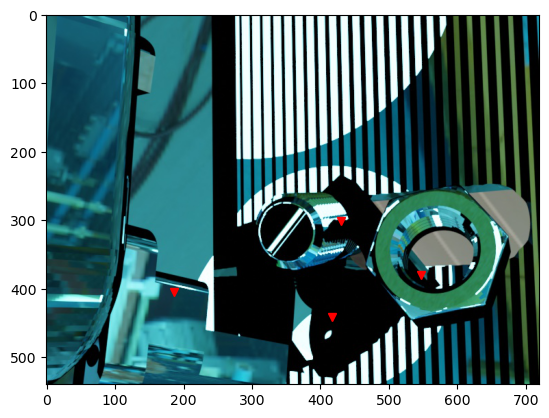

In [149]:
import matplotlib.pyplot as plt
im = debug_data['images'][0].cpu().numpy()
if im.shape[0] == 3:
    im = im.transpose((1, 2, 0))
    im = im[..., :4]
    print(im.shape)
imgplot = plt.imshow(im)
uv = debug_data['uv'].cpu().numpy()
print(uv.shape)
for i in range(uv.shape[0]):    
    print("uv", uv[i,0,...])
    plt.plot(uv[ix,0,0], uv[i,0,1], marker='v', color="red")
plt.imshow(im)
plt.show()

In [150]:
plotted = []
for img in debug_data['renders']:
    plotted.append(plotter.plot_image(img))
show(gridplot([plotted], sizing_mode='scale_width'))

In [148]:
plotted = []
for img in debug_data['images_crop']:
    plotted.append(plotter.plot_image(img))
show(gridplot([plotted], sizing_mode='scale_width'))

In [139]:
debug_data['renders'].shape

torch.Size([1, 3, 240, 320])